# Color normalization

The first step in analyzing digital pathology images is often preprocessing the
color image to correct staining or imaging variations. These examples illustrate how 
to use HistomicsTK to normalize color profiles and to generate augmented color images for machine learning.

In [1]:
import girder_client
import numpy as np
from skimage.transform import resize
from matplotlib import pylab as plt
from matplotlib.colors import ListedColormap
from histomicstk.preprocessing.color_normalization import reinhard
from histomicstk.saliency.tissue_detection import (
    get_slide_thumbnail, get_tissue_mask)
from histomicstk.annotations_and_masks.annotation_and_mask_utils import (
    get_image_from_htk_response)
from histomicstk.preprocessing.color_normalization.\
    deconvolution_based_normalization import deconvolution_based_normalization
from histomicstk.preprocessing.color_deconvolution.\
    color_deconvolution import color_deconvolution_routine, stain_unmixing_routine
from histomicstk.preprocessing.augmentation.\
    color_augmentation import rgb_perturb_stain_concentration, perturb_stain_concentration

## Start girder client and set analysis parameters

In [2]:
APIURL = 'http://candygram.neurology.emory.edu:8080/api/v1/'
SAMPLE_SLIDE_ID = '5d817f5abd4404c6b1f744bb'

gc = girder_client.GirderClient(apiUrl=APIURL)
# gc.authenticate(interactive=True)
gc.authenticate(apiKey='kri19nTIGOkWH01TbzRqfohaaDWb6kPecRqGmemb')

MAG = 1.0

# color norm. standard (from TCGA-A2-A3XS-DX1, Amgad et al, 2019)
cnorm = {
    'mu': np.array([8.74108109, -0.12440419,  0.0444982]),
    'sigma': np.array([0.6135447, 0.10989545, 0.0286032]),
}

# TCGA-A2-A3XS-DX1_xmin21421_ymin37486_.png, Amgad et al, 2019)
# for macenco (obtained using rgb_separate_stains_macenko_pca()
# and reordered such that columns are the order:
# Hamtoxylin, Eosin, Null
W_target = np.array([
    [0.5807549,  0.08314027,  0.08213795],
    [0.71681094,  0.90081588,  0.41999816],
    [0.38588316,  0.42616716, -0.90380025],
])

# visualization color map
vals = np.random.rand(256, 3)
vals[0, ...] = [0.9, 0.9, 0.9]
cMap = ListedColormap(1 - vals)

# for visualization
ymin, ymax, xmin, xmax = 1000, 1500, 2500, 3000

# for reproducibility
np.random.seed(0)

## Get images and tissue mask

In [3]:
# get RGB image at a small magnification
slide_info = gc.get('item/%s/tiles' % SAMPLE_SLIDE_ID)
getStr = '/item/%s/tiles/region?left=%d&right=%d&top=%d&bottom=%d' % (
    SAMPLE_SLIDE_ID, 0, slide_info['sizeX'], 0, slide_info['sizeY'],
    ) + '&magnification=%.2f' % MAG
tissue_rgb = get_image_from_htk_response(
    gc.get(getStr, jsonResp=False))

# get mask of things to ignore
thumbnail_rgb = get_slide_thumbnail(gc, SAMPLE_SLIDE_ID)
mask_out, _ = get_tissue_mask(
    thumbnail_rgb, deconvolve_first=True,
    n_thresholding_steps=1, sigma=1.5, min_size=30)
mask_out = resize(
    mask_out == 0, output_shape=tissue_rgb.shape[:2],
    order=0, preserve_range=True) == 1

### Let's visualize the data

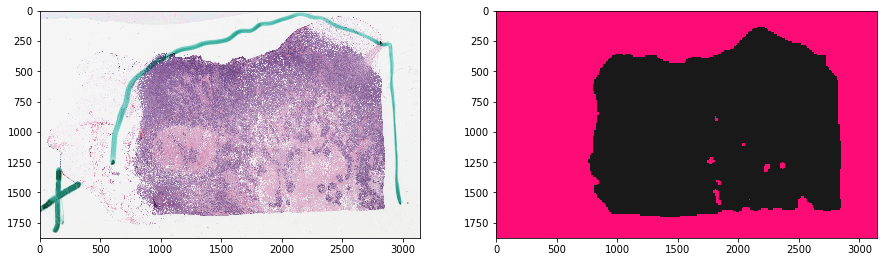

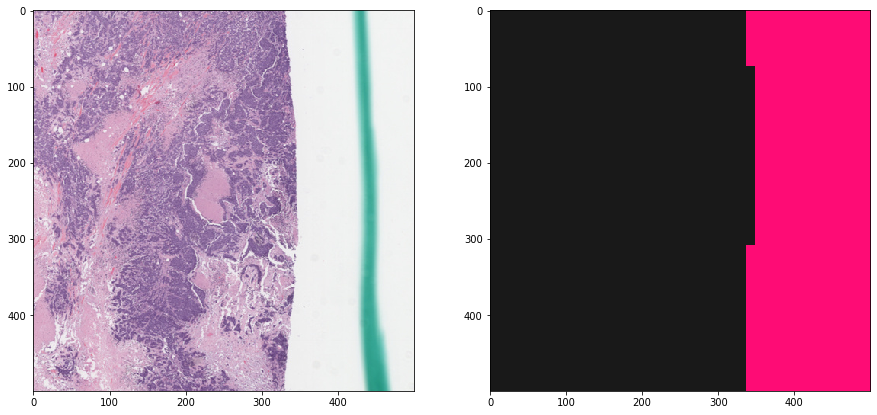

In [4]:
f, ax = plt.subplots(1, 2, figsize=(15, 15))
ax[0].imshow(tissue_rgb)
ax[1].imshow(mask_out, cmap=cMap)
plt.show()

f, ax = plt.subplots(1, 2, figsize=(15, 15))
ax[0].imshow(tissue_rgb[ymin:ymax, xmin:xmax, :])
ax[1].imshow(mask_out[ymin:ymax, xmin:xmax], cmap=cMap)
plt.show()

## Reinhard normalization

In [5]:
print(reinhard.__doc__)

Perform Reinhard color normalization.

    Transform the color characteristics of an image to a desired standard.
    The standard is defined by the mean and standard deviations of the target
    image in LAB color space defined by Ruderman. The input image is converted
    to Ruderman's LAB space, the LAB channels are each centered and scaled to
    zero-mean unit variance, and then rescaled and shifted to match the target
    image statistics. If the LAB statistics for the input image are provided
    (`src_mu` and `src_sigma`) then these will be used for normalization,
    otherwise they will be derived from the input image `im_src`.

    Parameters
    ----------
    im_src : array_like
        An RGB image

    target_mu : array_like
        A 3-element array containing the means of the target image channels
        in LAB color space.

    target_sigma : array_like
        A 3-element array containing the standard deviations of the target
        image channels in LAB color space

### Reinhard normalization - without masking

Notice how non-tissue elements throw off the normalization algorithm.

In [6]:
tissue_rgb_normalized = reinhard(
    tissue_rgb, target_mu=cnorm['mu'], target_sigma=cnorm['sigma'])

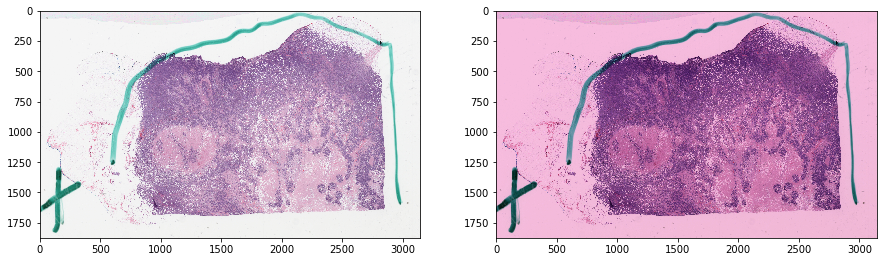

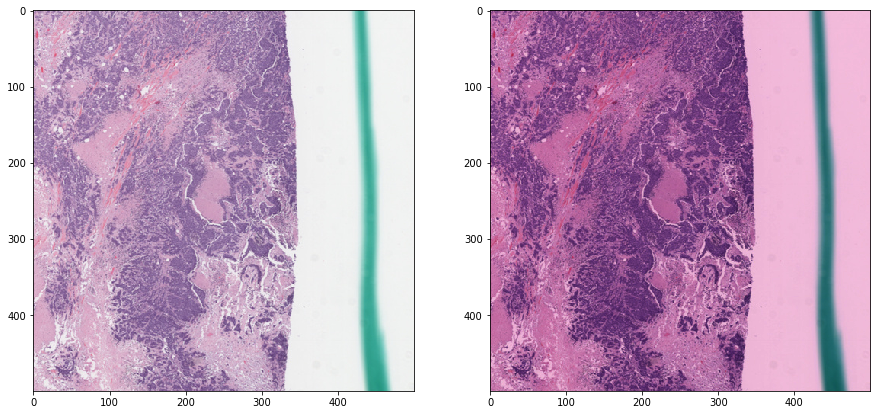

In [7]:
def vis_result():
    f, ax = plt.subplots(1, 2, figsize=(15, 15))
    ax[0].imshow(tissue_rgb)
    ax[1].imshow(tissue_rgb_normalized)
    plt.show()

    f, ax = plt.subplots(1, 2, figsize=(15, 15))
    ax[0].imshow(tissue_rgb[ymin:ymax, xmin:xmax, :])
    ax[1].imshow(tissue_rgb_normalized[ymin:ymax, xmin:xmax, :])
    plt.show()

vis_result()

### Reinhard normalization - with masking

Now we mask out irrelevant areas when calculating the statistics. Notice how the result is much better.

In [8]:
tissue_rgb_normalized = reinhard(
    tissue_rgb, target_mu=cnorm['mu'], target_sigma=cnorm['sigma'],
    mask_out=mask_out)

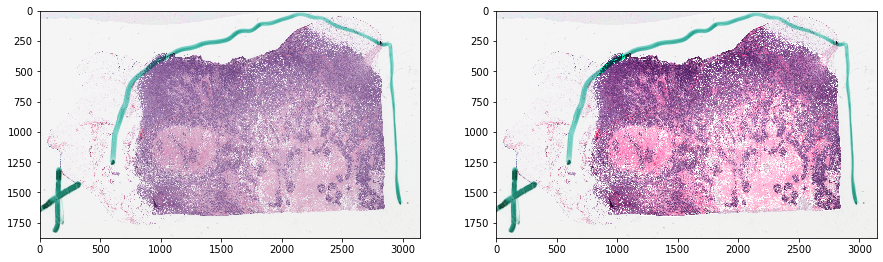

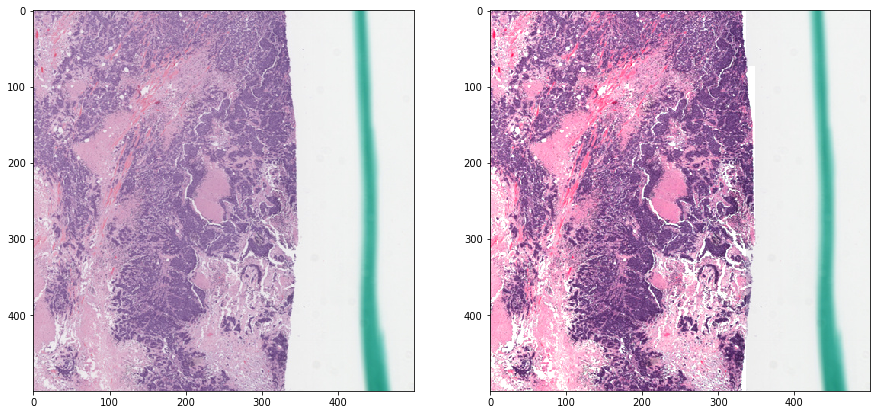

In [9]:
vis_result()

## Deconvolution-based normalization

Unlike reinhard, which simply matched the mean and standard deviation of the image to a prespecified target, these methods are "smarter", in the sense that they first unmix the stains and then convolve with a desired stain standard.

Macenko stain unmixing is used by default, but the method is general and may be
used with other stain unmixing methods in this repository such as the
SNMF method of Xu et al.

In [10]:
print(deconvolution_based_normalization.__doc__)

Perform color normalization using color deconvolution to transform the.

    ... color characteristics of an image to a desired standard.
    After the image is deconvolved into its component stains (eg, H&E), it is
    convolved with a stain column vectors matrix from the target image from
    which the color characteristics need to be transferred.

    Parameters
    ------------
    im_src : array_like
        An RGB image (m x n x 3) to color normalize

    W_source : np array, default is None
        A 3x3 matrix of source stain column vectors. Only provide this
        if you know the stains matrix in advance (unlikely) and would
        like to perform supervised deconvolution. If this is not provided,
        stain_unmixing_routine() is used to estimate W_source.

    W_target : np array, default is None
        A 3x3 matrix of target stain column vectors. If not provided,
        and im_target is also not provided, the default behavior is to use
        histomicstk.preprocessi

In [11]:
print(color_deconvolution_routine.__doc__)

Unmix stains mixing followed by deconvolution (wrapper).

    Parameters
    ------------
    im_rgb : array_like
        An RGB image (m x n x 3) to colro normalize

    W_source : np array, default is None
        A 3x3 matrix of source stain column vectors. Only provide this
        if you know the stains matrix in advance (unlikely) and would
        like to perform supervised deconvolution. If this is not provided,
        stain_unmixing_routine() is used to estimate W_source.

    kwargs : k,v pairs
        Passed as-is to stain_unmixing_routine() if W_source is None.

    Returns
    --------
    Output from color_deconvolution()

    See Also
    --------
    histomicstk.preprocessing.color_deconvolution.stain_unmixing_routine
    histomicstk.preprocessing.color_deconvolution.color_deconvolution

    


In [12]:
print(stain_unmixing_routine.__doc__)

Perform stain unmixing using the method of choice (wrapper).

    Parameters
    ------------
    im_rgb : array_like
        An RGB image (m x n x 3) to unmix.

    stains : list, optional
        List of stain names (order is important). Default is H&E. This is
        particularly relevant in macenco where the order of stains is not
        preserved during stain unmixing, so this method uses
        histomicstk.preprocessing.color_deconvolution.find_stain_index
        to reorder the stains matrix to the order provided by this parameter

    stain_unmixing_method : str, default is 'macenko_pca'
        stain unmixing method to use. It should be one of the following
        'macenko_pca', or 'xu_snmf'.

    stain_unmixing_params : dict, default is an empty dict
        kwargs to pass as-is to the stain unmixing method.

    mask_out : array_like, default is None
        if not None, should be (m x n) boolean numpy array.
        This parameter ensures exclusion of non-masked areas f

### Macenko normalization - without masking

In [13]:
stain_unmixing_routine_params = {
    'stains': ['hematoxylin', 'eosin'],
    'stain_unmixing_method': 'macenko_pca',
}
tissue_rgb_normalized = deconvolution_based_normalization(
            tissue_rgb, W_target=W_target,
            stain_unmixing_routine_params=stain_unmixing_routine_params)

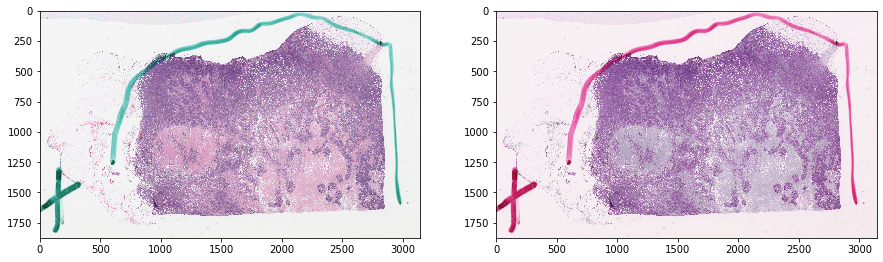

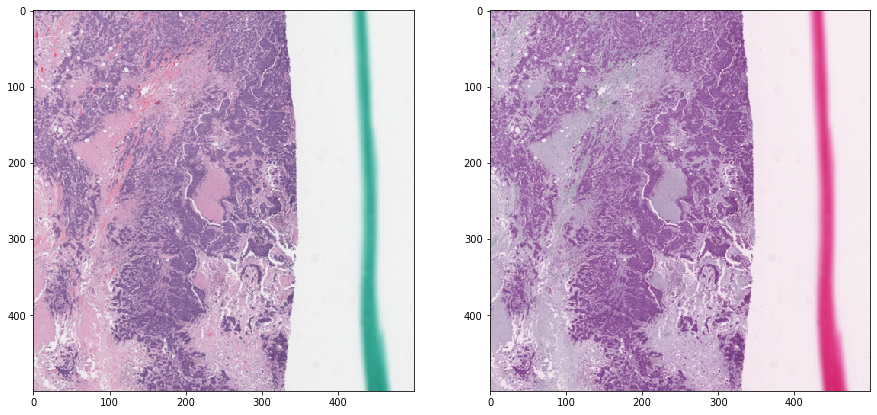

In [14]:
vis_result()

### Macenko normalization - with masking

In [15]:
tissue_rgb_normalized = deconvolution_based_normalization(
        tissue_rgb,  W_target=W_target,
        stain_unmixing_routine_params=stain_unmixing_routine_params,
        mask_out=mask_out)

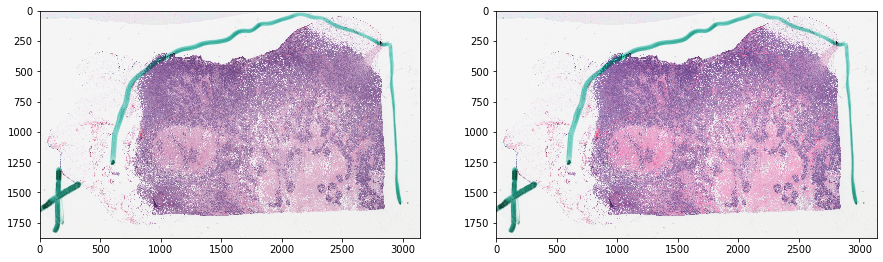

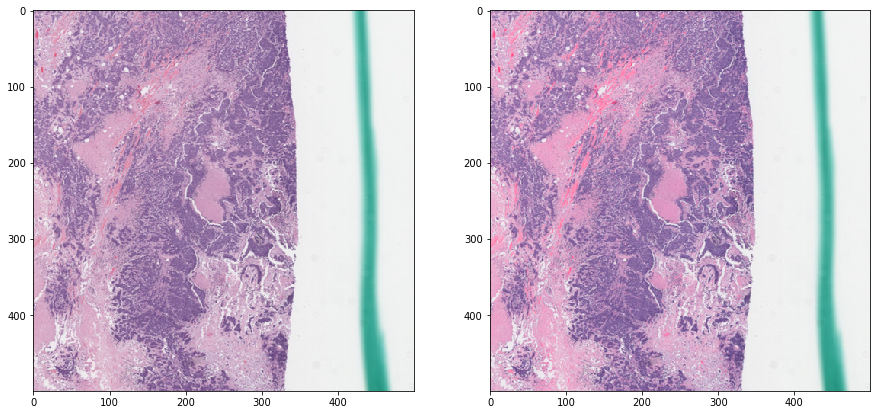

In [16]:
vis_result()

# "Smart" color augmentation

This is an implementation of the paper by Tellez et al, 2018 (see docstring below), whereby the stain concentrations are perturbed so that a more realistic model of stiaining variability in histology is modeled.

In [17]:
print(perturb_stain_concentration.__doc__)

Perturb stain concentrations in SDA space and return augmented image.

    This is an implementation of the method described in Tellez et
    al, 2018 (see below). The SDA matrix is perturbed by multiplying each
    channel independently by a value chosen from a random uniform distribution
    in the range [1 - sigma1, 1 + sigma1], then add a value chose from another
    random uniform distribution in the range [-sigma2, sigma2].

    Parameters
    ------------
    StainsFloat : array_like
        An intensity image (m, n, 3) of deconvolved stains that is unbounded,
        suitable for reconstructing color images of deconvolved stains
        with color_convolution.

    W : array_like
        A 3x3 complemented stain matrix.

    I_0 : float or array_like, optional
        A float a 3-vector containing background RGB intensities.
        If unspecified, use the old OD conversion.

    mask_out : array_like, default is None
        if not None, should be (m x n) boolean numpy array.


In [18]:
print(rgb_perturb_stain_concentration.__doc__)

Apply wrapper that calls perturb_stain_concentration() on RGB.

    Parameters
    ------------
    im_rgb : array_like
        An RGB image (m x n x 3) to colro normalize

    stain_unmixing_routine_params : dict
        kwargs to pass as-is to the color_deconvolution_routine().

    kwargs : k,v pairs
        Passed as-is to perturb_stain_concentration()

    Returns
    --------
    array_like
        Color augmented RGB image (m x n x 3)

    


## Let's perturb the H&E concentrations a bit

In [19]:
rgb = tissue_rgb[ymin:ymax, xmin:xmax, :]
exclude = mask_out[ymin:ymax, xmin:xmax]
augmented_rgb = rgb_perturb_stain_concentration(rgb, mask_out=exclude)

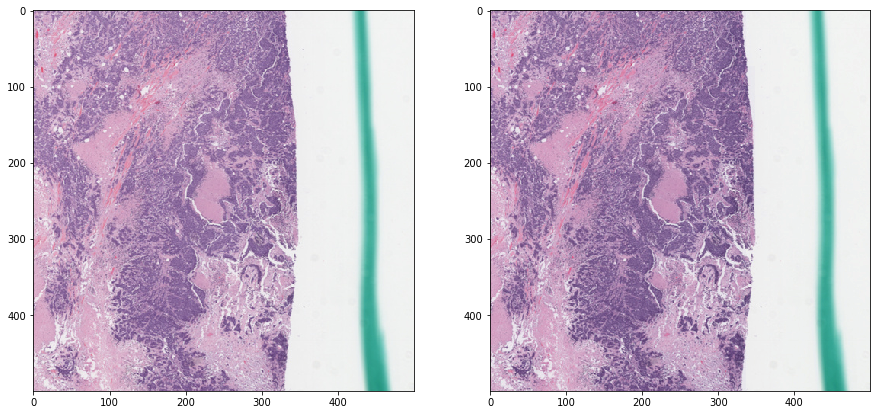

In [20]:
def vis_augmentation():
    f, ax = plt.subplots(1, 2, figsize=(15, 15))
    ax[0].imshow(rgb)
    ax[1].imshow(augmented_rgb)
    plt.show()

vis_augmentation()

## Try a few more times

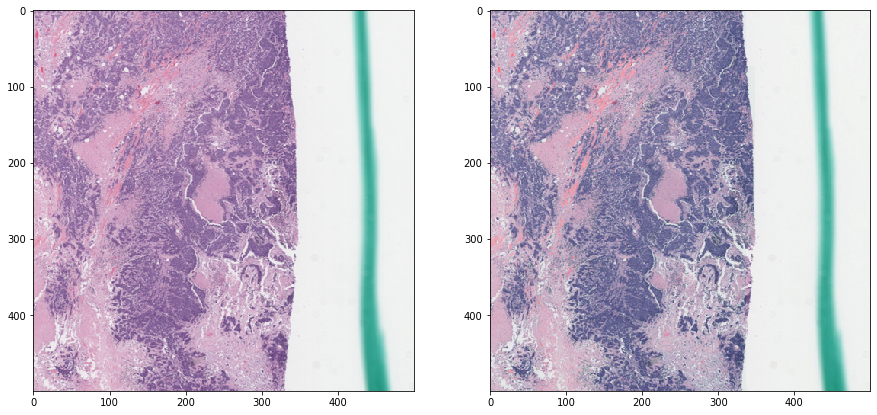

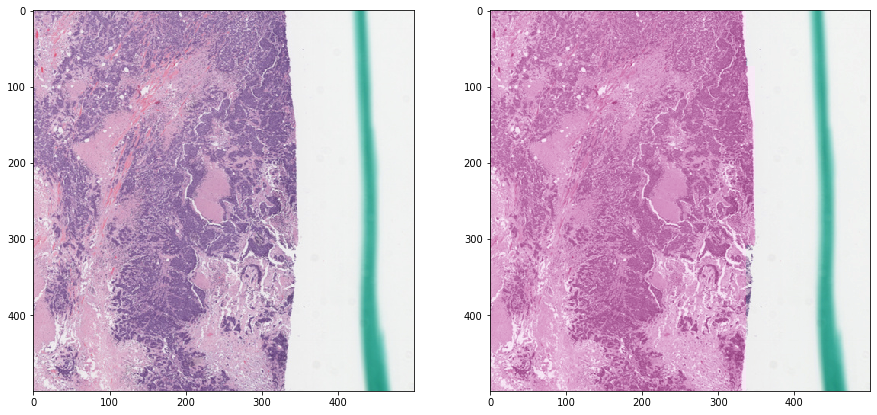

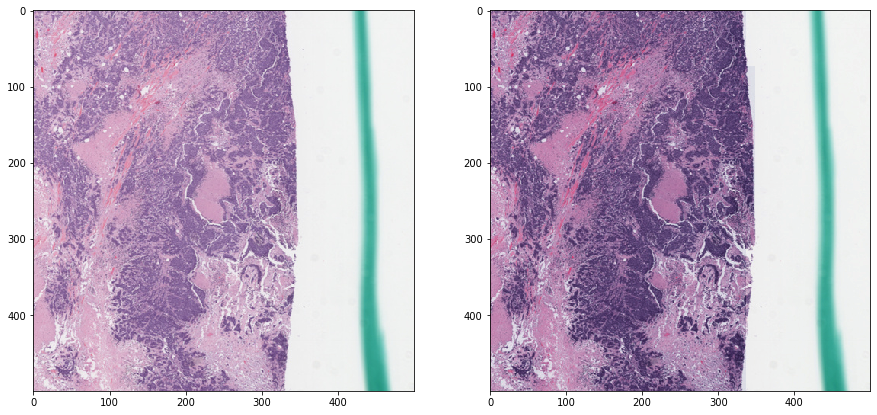

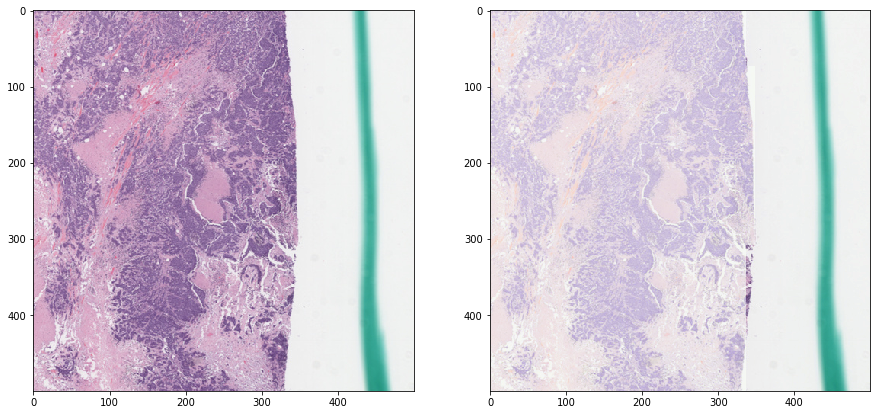

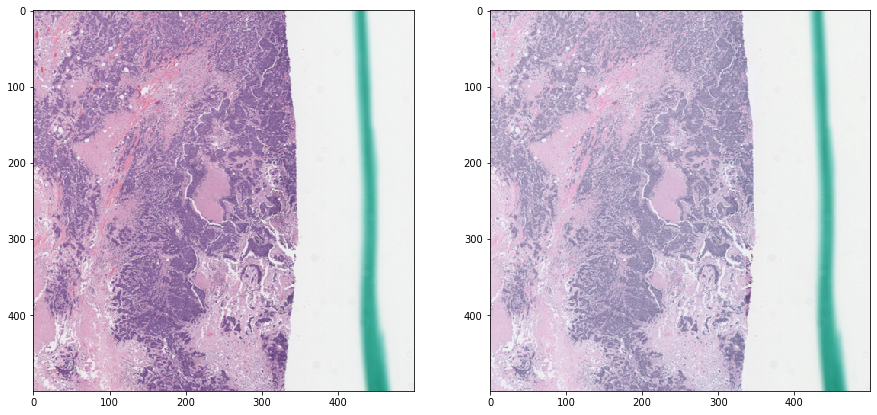

In [21]:
for _ in range(5):
    augmented_rgb = rgb_perturb_stain_concentration(rgb, mask_out=exclude)
    vis_augmentation()